# Continut:

## 0. Importul instrumentelor
## 1. prelucrarea datelor
## 2. Preprocesarea imaginilor (setarea in tensori)
## 3. Constructia modelului
## 4. Evaluarea modelului
## 5. Training-ul modelului pe intregul set de date
## 6. Predictia asupra propriilor date


```
# Acesta are format de cod
```

# 0. Importul instrumentelor

In [100]:
# import TensorFlow in colab si verificarea versiunii
import tensorflow as tf
print('TensorFlow version:', tf.__version__)


TensorFlow version: 2.5.0


In [101]:
# import TensorFlow Hub si vrificarea versiunii
import tensorflow_hub as hub
print('Tensoflow Hub version:', hub.__version__)

Tensoflow Hub version: 0.12.0


In [102]:
# se verifica disponibilitatea GPU
print("GPU", "este disponibil (YESSSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "este indisponibil :(")

GPU este indisponibil :(


In [103]:
#Se seteaza GPU urmand calea Runtime (Executie) -> Change runtime type (Schimbati tipul executie)

# 1. Prelucrarea datelor

## 1.1 Importul datelor si analiza lor

In [104]:
# Se incarca datele pe googledrive si se dezarhiveaza daca e necesar
#!unzip 'drive/MyDrive/Dog Vision/dog-breed-identification.zip' -d 'drive/MyDrive/Dog Vision/'

In [105]:
# Se verifica label-ul datelor (fisierul in care fiecarei denumiri a imiginii i se asociaza rasa corespunzatoare)
import pandas as pd
labels_csv=pd.read_csv('drive/MyDrive/Dog Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     61664c4d0be465a085b11a1cd36be3b1  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [106]:
# afiseaza primele 5 date din fisierul label
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [107]:
# Se verifica cate imagini sunt pentru fiecare rasa (se recomanda minimum 10)
labels_csv['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
komondor                 67
brabancon_griffon        67
golden_retriever         67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

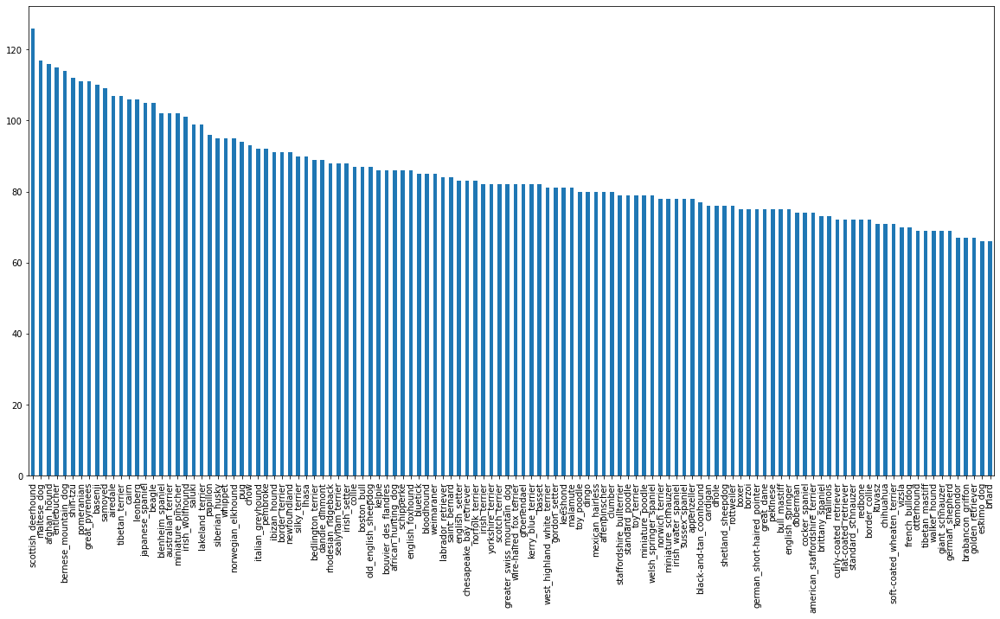

In [108]:
# Se prezinta in forma grafica numarul de poze corespunzator fiecarei rase
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10));

In [109]:
# se determina numarul median de imagini corespunzator unei rase
labels_csv['breed'].value_counts().median()

82.0

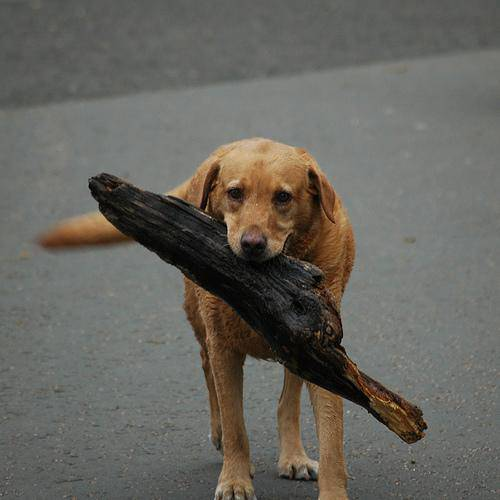

In [110]:
# vizualizarea unei imagini
from IPython.display import  Image
Image('drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg')

## 1.2. Formarea listei căilor de acces către imagini

In [111]:
# Formarea unui liste cu numele tuturor imaginilor
filenames=[fname +".jpg" for fname in labels_csv['id']]
filenames[:10]

['000bec180eb18c7604dcecc8fe0dba07.jpg',
 '001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '001cdf01b096e06d78e9e5112d419397.jpg',
 '00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '002211c81b498ef88e1b40b9abf84e1d.jpg',
 '00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '002a283a315af96eaea0e28e7163b21b.jpg',
 '003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '0042188c895a2f14ef64a918ed9c7b64.jpg']

In [112]:
# Formarea listei cu caiile catre fiecare imagine
pathfile = ['drive/MyDrive/Dog Vision/train/'+ fname for fname in filenames]
pathfile[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [113]:
# se cerifica daca numarul de cai coincide cu numarul de imagini
import os
if len(os.listdir('drive/MyDrive/Dog Vision/train/'))==len(pathfile):
  print("coincide")
else:
  print("nu coincide")

coincide


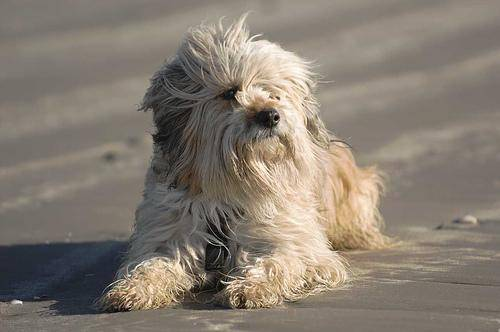

In [114]:
# Vizualizarea imagini dupa indexul caii din lista
Image(pathfile[4072])

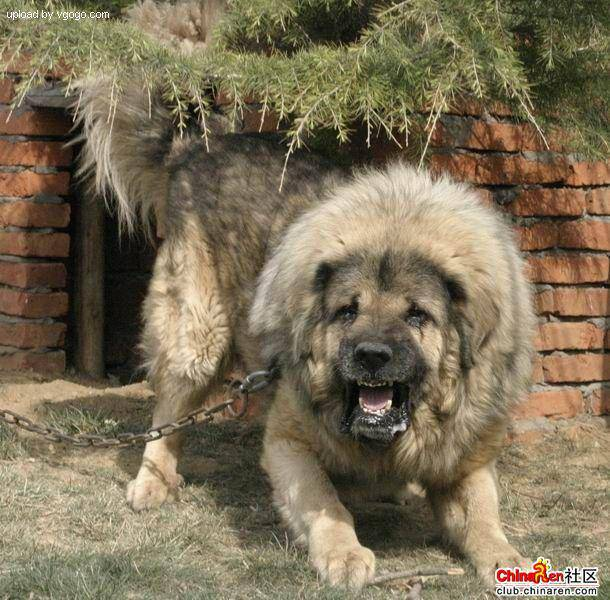

In [115]:
Image(pathfile[9000])

In [116]:
# verificarea rasei dupa indicele imaginii
labels_csv['breed'][9000]

'tibetan_mastiff'

## 1.3. Formarea coloanei label corespunzataore imaginilor 

In [117]:
# se transforma coloana label in array
import numpy as np
labels=labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [118]:
# se verifica lungimea array-ului
len(labels)

10222

In [119]:
# se verifica daca numarul de labels coincide cu numarul de cai

if len(labels)==len(pathfile):
  print("coincide")
else:
  print("nu coincide")

coincide


In [120]:
# se verifica cate valori unice sunt in labels
import numpy as np
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [121]:
# se verifica numarul de rase
len(unique_breeds)

120

In [122]:
unique_breeds[79]

'norfolk_terrier'

## 1.4. Conversia valorilor coloanei label in valori numerice (de fapt boolean) 

In [123]:
# conversia unei valori a coloanei label in valoare numerica)

print(labels[0])
labels[0]==unique_breeds


boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [124]:
# Conversia intregii coloane label in valori numerice
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [125]:
# Se afiseaza rasa corespunzatoare indexului 1 in label
print(labels[1])

dingo


In [126]:
# Verificarea corestitudinii conversiei

print(labels[1]) # label original
print(np.where(unique_breeds==labels[1])) # indexul unde label apare unique_breeeds
print(boolean_labels[1].argmax()) # indexul unde label apare in boolean_array
print(boolean_labels[1].astype(int)) # conversia True in 1 si False in 0

dingo
(array([37]),)
37
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## 1.5. Formarea subseturilor de date

In [127]:
# Setarea caii imaginilor in set X si labelui converti in valori numerice in set y
X=pathfile
y=boolean_labels

In [128]:
# Verificarea lungimii setului x
len(X)

10222

In [129]:
# Se reduce numarul datelor la 1000 si apoi
# se vor creste la nevoie


NUM_IMAGES=1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [130]:
# Se divizeaza datele in set de training si set de validare
from sklearn.model_selection import  train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=9)

In [131]:
# se verifica lungimea seturilor formate
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

# 2. Preprocesarea imaginilor (setarea in Tensors)


## 2.1. Conversia imaginii in tensors

In [132]:
# Converisa imaginii (pe exemplu imaginii cu indexul 9 ) in numpy array (cu codul pixelor)

from matplotlib.pyplot import imread

image=imread(pathfile[9])

image.shape

(332, 500, 3)

In [133]:
# vizualizarea imaginii in format numpy array
image

array([[[  5,   6,   0],
        [  5,   6,   0],
        [  6,   7,   0],
        ...,
        [ 90, 100,  40],
        [ 88,  98,  38],
        [ 86,  96,  36]],

       [[  6,   7,   0],
        [  7,   8,   0],
        [  7,   8,   0],
        ...,
        [ 93, 103,  43],
        [ 91, 101,  41],
        [ 90, 100,  40]],

       [[  8,   9,   1],
        [  8,   9,   1],
        [  8,   9,   1],
        ...,
        [ 90, 100,  39],
        [ 89,  99,  38],
        [ 88,  98,  37]],

       ...,

       [[ 80,  92,  56],
        [ 60,  72,  36],
        [ 59,  71,  35],
        ...,
        [ 93, 109,  60],
        [ 93, 109,  60],
        [ 93, 109,  60]],

       [[ 84,  94,  57],
        [ 62,  72,  35],
        [ 81,  91,  54],
        ...,
        [ 94, 110,  61],
        [ 95, 111,  62],
        [ 95, 111,  62]],

       [[ 78,  86,  47],
        [ 57,  65,  26],
        [ 98, 106,  69],
        ...,
        [ 95, 111,  62],
        [ 96, 112,  63],
        [ 96, 112,  63]]

In [134]:
# afisarea valorilor maxime si minime (valorile pixelor)
image.max(), image.min()

(255, 0)

In [135]:
# Conversia imaginii in tensors pentru a putea fi procesate in GPU
tf.constant(image)

<tf.Tensor: shape=(332, 500, 3), dtype=uint8, numpy=
array([[[  5,   6,   0],
        [  5,   6,   0],
        [  6,   7,   0],
        ...,
        [ 90, 100,  40],
        [ 88,  98,  38],
        [ 86,  96,  36]],

       [[  6,   7,   0],
        [  7,   8,   0],
        [  7,   8,   0],
        ...,
        [ 93, 103,  43],
        [ 91, 101,  41],
        [ 90, 100,  40]],

       [[  8,   9,   1],
        [  8,   9,   1],
        [  8,   9,   1],
        ...,
        [ 90, 100,  39],
        [ 89,  99,  38],
        [ 88,  98,  37]],

       ...,

       [[ 80,  92,  56],
        [ 60,  72,  36],
        [ 59,  71,  35],
        ...,
        [ 93, 109,  60],
        [ 93, 109,  60],
        [ 93, 109,  60]],

       [[ 84,  94,  57],
        [ 62,  72,  35],
        [ 81,  91,  54],
        ...,
        [ 94, 110,  61],
        [ 95, 111,  62],
        [ 95, 111,  62]],

       [[ 78,  86,  47],
        [ 57,  65,  26],
        [ 98, 106,  69],
        ...,
        [ 95, 111,  6

## 2.2. Elaborarea unei functii ce va realiza preprocesarea imaginilor

In [136]:
# Definirea dimensiunilor imaginilor

IMG_SIZE=224

In [137]:
# Crearea functiei de procesare a imaginilor
def process_image(image_path, img_size=IMG_SIZE):
  """"
  Transforma imaginea de pe calea specificata in imagini format Tensor
  """
  #Citirea imaginii
  image=tf.io.read_file(image_path)

  # Transformarea imaginii jpeg in numere Tensor cu 3 canale (Red, Green, Blue)
  image=tf.image.decode_jpeg(image, channels=3)

  #Transformarea valorilor din gama 0-255 in valori din gama 0-1
  image=tf.image.convert_image_dtype(image, tf.float32)

  # Redimensionarea imaginii la valorile dorite (224, 224)
  image=tf.image.resize(image, size=[img_size, img_size])

  return image


## 2.3. Crearea bancurilor de date (data batches)

Se vor procesa bancuri a cate 32 (dimensiunea bancului poate fi ajustata manual) imagini concomitent (nu toate imaginile) pentru a utiliza eficient memoria 

In [138]:
# Se creaza o functie ce va returna datele sub forma unui tuple (image, label) pentru o functionare efectiva a Tensor
def get_image_label(image_path, label):
  '''
  Primeste numele caii spre imagine si label-ul asociat si returneaza un tuple (image, label)
  '''
  image=process_image(image_path)
  return image, label

In [139]:
# Se defineste dimensiunea bancului

BATCH_SIZE=32

In [140]:
X

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog Vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [141]:
# Se creaza o functie ce va transforma toate datele (X si y) in batch de 32 imagini
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creaza bancuri din perechile de date imagine (X) si label (y) .
  Amesteca datele de training in cazul in care nu sunt datele de validare
  Deasemenea accepta si datele de test
  '''
  # daca datele sunt cele de test (fara label)
  if test_data:
    print('Se creaza bancul pentru datele de test')
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch=data.map(process_image).batch(batch_size)
    return data_batch
  
  # Daca sunt datele de validare (nu trebuie amestecate)
  elif valid_data:
    print('Se creaza bancul pentru datele de validare')
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch

  # Daca sunt doar datele de training
  else:
    print('Se creaza bancul pentru datele de training')
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    data=data.shuffle(buffer_size=len(X)) # amestecarea datelor
    data=data.map(get_image_label)

    data_batch=data.batch(batch_size)
    return data_batch



In [215]:
type(X)

list

In [142]:
# Formarea bacurilor pentru datele de training si validare
train_data=create_data_batches(X_train, y_train)
val_data=create_data_batches(X_val, y_val, valid_data=True)

Se creaza bancul pentru datele de training
Se creaza bancul pentru datele de validare


In [143]:
# Verificarea atributelor bancului
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## 2.4. Vizualizarea bancurilor de date

In [144]:
import matplotlib.pyplot as plt

# Crearea functiei de afisare a imaginilor din banc

def show_32_images(images, labels):
  """
  Afiseaza 32 de imagini pentru care titlul va constituie denumirea rasei
  """
  # Se seteaza figura
  plt.figure(figsize=(20, 10))
  # Se itereaza prin 32 (pentru a se afisa 32 de imagini)
  for i in range(32):
    # se creaza subgrafice
    ax=plt.subplot(4, 8, i+1)
    # se afiseaza o imagine
    plt.imshow(images[i])
    # Se adauga in calitate de titlu label-ul imaginii
    plt.title(unique_breeds[labels[i].argmax()])
    # se elimina axele
    plt.axis('off')

In [145]:
# Se transforma date din banc in numpy array
train_images, train_labels = next(train_data.as_numpy_iterator())

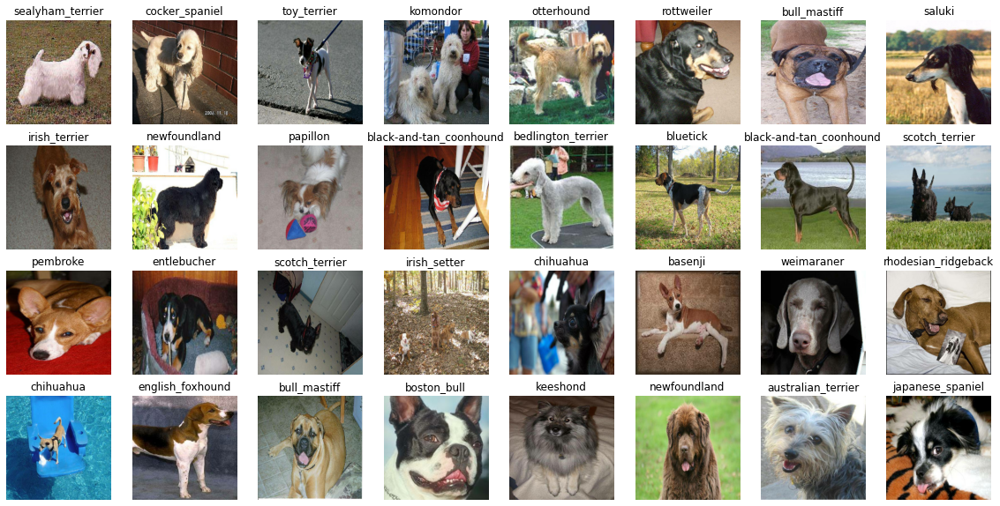

In [146]:
# Apelarea functiei de vizualizare a imaginilor training
show_32_images(train_images, train_labels)

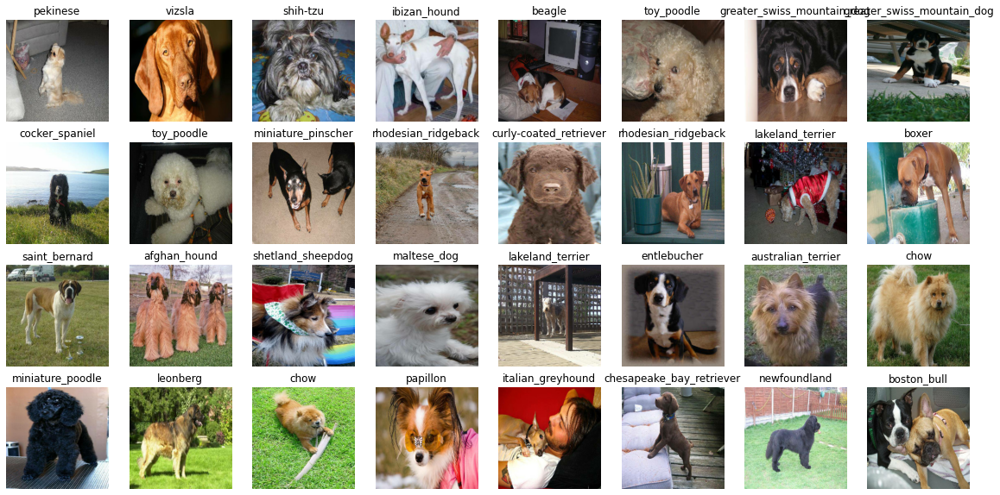

In [147]:
# Apelarea functiei de vizualizare a imaginilor validation prin transformarea preventiva in numpy array
val_images, val_labels = next(val_data.as_numpy_iterator())
show_32_images(val_images, val_labels)

# 3. Constructia modelului

## 3.1. Definirea formei datelor de intrare si iesire

In [148]:
# Setarea formei datelor de intrare
INPUT_SHAPE=[None, IMG_SIZE, IMG_SIZE, 3] # banc, inaltime, latine , canalul de  culori (RGB)

# Setarea formei datelor de iesire
OUTPUT_SHAPE=len(unique_breeds)

## 3.2. Setarea URL modelului din TensorFLow Hub

In [149]:
# Setarea URL modelului din TensorFLow Hub
MODEL_URL='https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

## 3.3. Keras deep learning model

In [150]:
# Crearea functiei de constructie a modelului Keras
def create_model(input_shape=INPUT_SHAPE, ouput_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print ('Constructia modelului cu:', MODEL_URL)

  #Setarea nivelelor modelului
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), # Nivelul 1 de intrare
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") # Nivelul 2 de iesire
  ])

  #Compilarea modelului
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # constructia modelului
  model.build(INPUT_SHAPE)

  return model

In [151]:
# Vizualizare parametrilor mmodelului
model=create_model()
model.summary()

Constructia modelului cu: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer_2 (KerasLayer)   (None, 1001)              5432713   
_________________________________________________________________
dense_2 (Dense)              (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## 3.4. Crearea Callbacks

Callbacks permite monitorizarea procedului de functionarea a modelului și oprirea acestuia atunci cand parametrii de calitate nu mai cresc pentru a econimisi timp

In [152]:
# Incarcarea TensorBoard ca extensie a lui notebook
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [153]:
# Crearea unei functii ce va permite TensorBoard callbacks sa salveze datele de logare
import datetime
def create_tensorboard_callback():
  # se creaza un folder de logare pentru pastrarea datelor de logare a TensorBoard
  log_dir=os.path.join('drive/MyDrive/Dog Vision/logs', 
                      datetime.datetime.now().strftime('%H%M%S-%d%m%Y'))
  return tf.keras.callbacks.TensorBoard(log_dir)

In [154]:
#  Crearea Early Stopping Callback ce va permite stoparea modelului pentru a evita supraincarcarea
early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                patience=5)

## 3.5. Taining-ul modelului 

In [155]:
# Taining pe 1000 de imagini
NUM_EPOCHS=100 #@param {type:'slider', min:10, max:101, step:10}

In [156]:
# se verifica disponibilitatea GPU
print("GPU", "este disponibil (YESSSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "este indisponibil :(")

GPU este indisponibil :(


In [157]:
# Se creaza o functie ce va realiza taining-ul modelului
def train_model():

  # se creaza modelul
  model=create_model()

  # se creaza o sesiune tensorboard pentru fiecare training
  tensorboard=create_tensorboard_callback()

  # implementarea modelului pentru date
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  return model

In [158]:
#Apelarea functie de creare a modelului de training
## model=train_model() # se comenteaza deoarece a fost salvat si nu trebuie sa mai incarce sistemul

## 3.6. Salvarea și incarcarea modelului

Deoarece pentru training-ul modelului este necesara o perioada lunga de timp este util ca imediat ce s-a realizat training-ul, acesta sa fie salvat

In [159]:
# Crearea unei functii de salvarea a modelului

def save_model(model, suffix=None):
  # Se creaza directoriu
  modeldir=os.path.join('drive/MyDrive/Dog Vision/models',
                        datetime.datetime.now().strftime('%H%M%s-%d%m%Y'))
  model_path=modeldir + '-' + suffix + '.h5'  #h5 este formatul de salvare a modelului
  print(f'Salvarea modelului ca {model_path}')
  model.save(model_path)
  return model_path

In [160]:
#Salvarea modelului pentru 1000 imagini
## save_model(model, suffix="1000-images-mobilenetv2-Adam") 

In [161]:
# Se creaza o functie de incarcare a modelului salvat
def load_model(model_path):
  # Se creaza directoriu
  print(f'Se incarca modelul salvat pe {model_path}')
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={'KerasLayer':hub.KerasLayer})
  return model

In [162]:
# Se incarca modelul salvat
model = load_model("drive/MyDrive/Dog Vision/models/11251622719506-03062021-1000-images-mobilenetv2-Adam.h5")

Se incarca modelul salvat pe drive/MyDrive/Dog Vision/models/11251622719506-03062021-1000-images-mobilenetv2-Adam.h5


# 4. Evaluarea modelului

## 4.1. Evaluarea modelului cu TensorBoard

In [163]:
# Se verifica log TensorBoard cu functia %tensorboard ( se foloseste \ pentru a specifica spatiile goale)
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

## 4.2. Elaborarea si evaluarea predictiei utilizand modelul de training

In [164]:
# se realizeaza predictia pe setul de validare
predictions=model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 8s 993ms/step


array([[1.79817658e-02, 3.52325896e-03, 1.54144236e-05, ...,
        2.58467462e-05, 1.29879802e-04, 3.04355230e-02],
       [9.48002616e-06, 1.80542668e-06, 1.67816790e-04, ...,
        1.89818355e-04, 2.20830880e-05, 6.89423832e-05],
       [7.41761876e-04, 1.17002637e-04, 5.27356133e-05, ...,
        1.00373345e-05, 1.02532604e-05, 1.35248920e-04],
       ...,
       [5.41554252e-03, 5.66662675e-05, 6.33435207e-04, ...,
        1.75163932e-02, 4.90536622e-05, 2.92020291e-01],
       [1.10976631e-04, 2.61027890e-04, 2.98378636e-05, ...,
        7.68919745e-06, 7.99458139e-05, 1.52851688e-04],
       [4.05572428e-05, 3.31074557e-06, 2.06505483e-05, ...,
        2.49124855e-06, 1.68694405e-05, 4.50766674e-04]], dtype=float32)

In [165]:
# se verifica forma datelor prezise
predictions.shape

(200, 120)

In [166]:
# se verifica lungime label-ului de validare
len(y_val)

200

In [167]:
# se verifica numarul de rase unice
len(unique_breeds)

120

In [168]:
# Predictia primei imagini din setul de validare adica care este probabilitatea 
#  rasei cainelui acestei poze ca apartine unei dintre cele 120 de rase
predictions[0]

array([1.7981766e-02, 3.5232590e-03, 1.5414424e-05, 4.4999761e-06,
       2.3013379e-05, 1.5067808e-05, 6.7623056e-05, 2.8296845e-04,
       4.4689572e-04, 4.2738942e-05, 9.6433678e-06, 3.2061962e-03,
       1.5030965e-05, 4.2335273e-04, 6.3093057e-06, 3.1940861e-05,
       1.2673787e-04, 5.3528231e-05, 5.7679090e-06, 4.0996336e-05,
       6.3310254e-05, 4.1158833e-05, 5.0329785e-05, 4.8955629e-04,
       3.7609479e-05, 1.4929419e-05, 2.0396835e-04, 5.0047843e-06,
       3.3465674e-06, 7.1920012e-03, 1.2190587e-04, 4.6561428e-04,
       3.2977536e-03, 1.6828931e-04, 1.0172793e-04, 1.4561719e-03,
       2.1296971e-07, 1.4970973e-04, 3.9593993e-05, 4.2604061e-06,
       4.0523527e-04, 3.4260449e-07, 7.5090276e-05, 4.7626500e-06,
       2.6133805e-04, 1.4008944e-05, 9.4532010e-07, 3.2122469e-05,
       1.0040693e-05, 2.4051484e-01, 7.7843913e-05, 1.7836050e-05,
       1.3588745e-02, 4.1597218e-08, 3.0844567e-05, 5.0333387e-07,
       6.5113197e-04, 8.7719804e-05, 3.2014326e-05, 2.2131288e

In [169]:
# suma tuturor probabilitatilor
np.sum(predictions[72])

0.9999999

In [170]:
# Afisarea tuturor datelor de predictie pentru o imagine din setul de validare (pe exemplu imagini cu indexul 74)
index=74
print(predictions[index])
print(f'Cea mai marea probabilitate: {np.max(predictions[index])}')
print(f'Suma: {np.sum(predictions[index])}')
print(f'Indexul probabilitatii maxime: {np.argmax(predictions[index])}')
print(f'Valoarea prezisa: {unique_breeds[np.argmax(predictions[index])]}')



[7.20352866e-04 5.99276464e-05 1.48512161e-04 9.84158833e-03
 2.08409794e-04 6.34531665e-04 4.56374837e-04 1.56293565e-04
 1.25829727e-04 2.66006700e-05 1.86620397e-03 3.93870978e-05
 1.00530531e-04 3.21663320e-02 6.28466514e-05 2.87487725e-04
 3.00942811e-05 7.77011563e-04 1.46413483e-02 1.73987501e-04
 1.83125981e-03 1.15903249e-05 1.18900801e-03 1.45906175e-04
 1.25157908e-02 3.27170419e-05 2.00511960e-04 8.53993333e-05
 8.18418514e-04 8.44545229e-06 1.30485769e-05 9.28221794e-04
 7.49814615e-04 2.98725645e-04 6.80084107e-04 4.20825352e-04
 1.52316003e-04 1.30241911e-04 5.27535856e-04 5.75593254e-03
 5.05306176e-04 2.60593864e-04 2.24621661e-04 1.55456495e-04
 1.67187507e-04 1.72829707e-04 1.36244016e-05 5.22506307e-05
 5.86273905e-04 3.76249052e-04 1.34057380e-04 1.83333195e-05
 4.16490584e-05 2.73849309e-05 3.84712301e-04 5.18712169e-03
 4.72148036e-04 1.45668946e-02 2.89134168e-05 2.33391975e-03
 3.32514581e-04 2.96609197e-03 3.42099884e-05 2.60193454e-04
 1.61222909e-02 6.519386

In [171]:
# crearea functiei de transformare a probabilitatilor de predictie in label

def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]


In [172]:
#se apeleaza functia pentru a vizualiza rasa prezisa
get_pred_label(predictions[0])

'pekinese'

In [173]:
#verificarea datelor de validare
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [174]:
# Se creaza o functie de unbach datele de validare (imagine si label)
def unbatchify(data):
  images=[]
  labels=[]
  for image, label in val_data.unbatch().as_numpy_iterator():
      images.append(image)
      labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [175]:
# se apeleaza functia de unbach
val_images1, val_labels1=unbatchify(val_data)
val_images1[0], val_labels1[0]

(array([[[0.3918853 , 0.3918853 , 0.36051273],
         [0.43775532, 0.43775532, 0.40638277],
         [0.44351017, 0.44351017, 0.41213763],
         ...,
         [0.05796662, 0.02239764, 0.01937653],
         [0.05252095, 0.0470589 , 0.04978992],
         [0.04586835, 0.05371149, 0.04978992]],
 
        [[0.38653433, 0.38261276, 0.3630049 ],
         [0.4161569 , 0.41223532, 0.39262748],
         [0.43315482, 0.42923325, 0.4096254 ],
         ...,
         [0.0909924 , 0.05177672, 0.04754004],
         [0.03035708, 0.02489503, 0.02762605],
         [0.02370449, 0.03154762, 0.02762605]],
 
        [[0.36859885, 0.36467728, 0.34506944],
         [0.35422263, 0.35030106, 0.33069322],
         [0.39899355, 0.39507198, 0.3754641 ],
         ...,
         [0.2361781 , 0.20233706, 0.19541305],
         [0.04896353, 0.04268564, 0.04582458],
         [0.04459034, 0.04705883, 0.04582458]],
 
        ...,
 
        [[0.7591447 , 0.75522316, 0.7356153 ],
         [0.74550796, 0.7415864 , 0.72197

In [176]:
get_pred_label(val_labels1[0])

'affenpinscher'

In [177]:
get_pred_label(predictions[0])

'pekinese'

## 4.3. Vizualizarea rezultatelor compararii

### 4.3.1. Vizualizarea predictiei cu probabilitatea maxima

In [178]:
# se creaza o functie de vizualizarea a datelor prezise, datelor adevarate si imaginea corespunzatoare
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  Vizualizarea predictiei, valorii adevarate si a imagini pentru indexul n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  #Obtinerea valorii prezise
  pred_label=get_pred_label(pred_prob)

  #Plot imaginea si stergerea axelor
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Schimbara culorii titlului in funtie de predictia corecta sau grasita
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  # Fixarea titlului ca sa cuprinda toate componentele 
  plt.title(f' {pred_label} {np.max(pred_prob)*100:2.0f}% {true_label}', color=color)

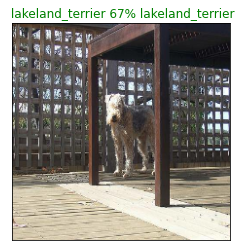

In [179]:
# Apelarea functiei de vizualizare pentru imaginea cu indexul 20
plot_pred(prediction_probabilities= predictions,
          labels=val_labels1, 
          images=val_images1, n=20)


### 4.3.2. Vizualizarea prezicerii cu primele 10 probabilitati

In [180]:
# se creaza o functie de vizualizarea a top 10 datelor prezise si evidentierea celei adevarate
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Vizualizarea predictiei, valorii adevarate si a imafini pentru sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  
  #Obtinerea valorii prezise
  pred_label=get_pred_label(pred_prob)

  # Determinarea indicilor primelor 10 predictii
  top_10_pred_indexes=pred_prob.argsort()[::-1][:10]

  # Determinarea celor 10 probabilitati cu valori cele mai mari
  top_10_pred_values=pred_prob[top_10_pred_indexes]

  # Determinarea prezicirelor care au 10 cele mai mari probabilitati
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  #Setarea graficului
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  #Schimbarea culorii
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
  else:
    pass


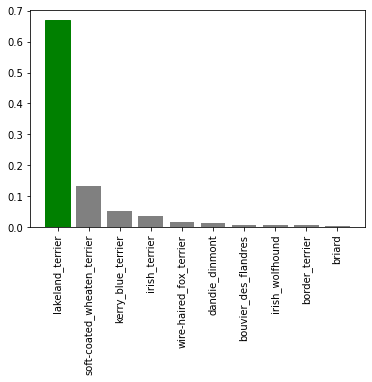

In [181]:
# Apelarea functiei penru imaginea cu indicile 
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels1, n=20)

### 4.3.3. Vizualizarea complexa

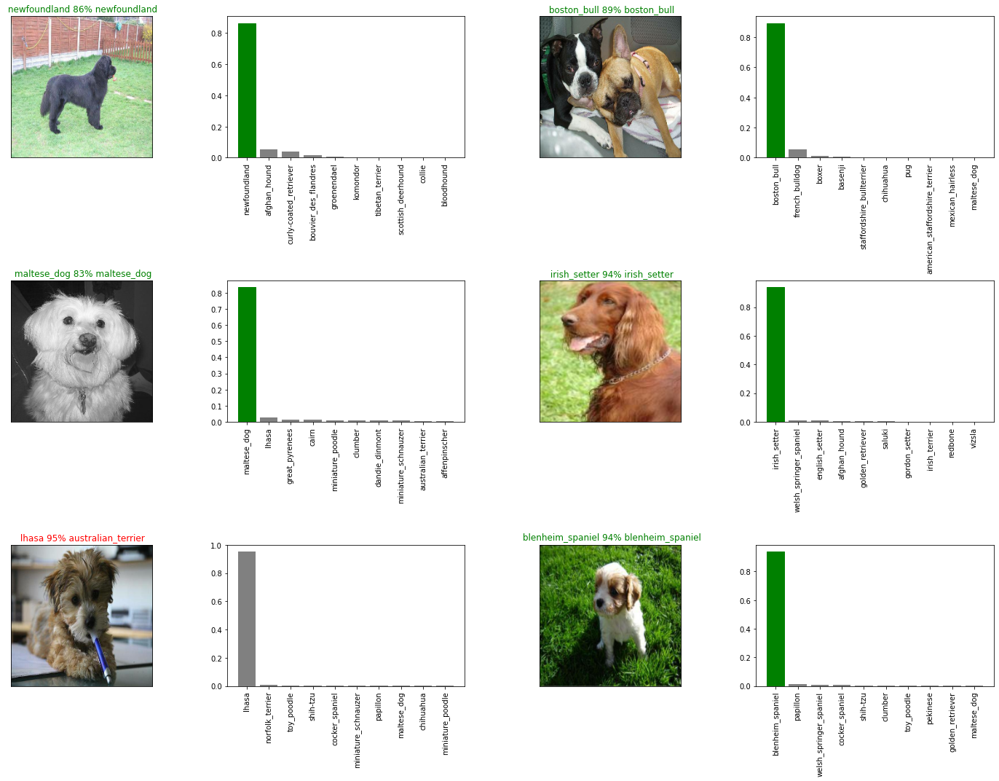

In [182]:
# Afisarea mai multor date in ordinea prezentei
i_multiplier=30
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels1,
            images=val_images1,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
            labels=val_labels1,
            n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [183]:
# Crearea functiei de afisare complexa dupa indicele imaginii
def compl_plot(i=0):
  plt.figure(figsize=(10, 5))
  plt.subplot(1, 2, 1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels1,
            images=val_images1,
            n=i)
  plt.subplot(1, 2, 2)
  plot_pred_conf(prediction_probabilities=predictions,
            labels=val_labels1,
            n=i)
  plt.show()

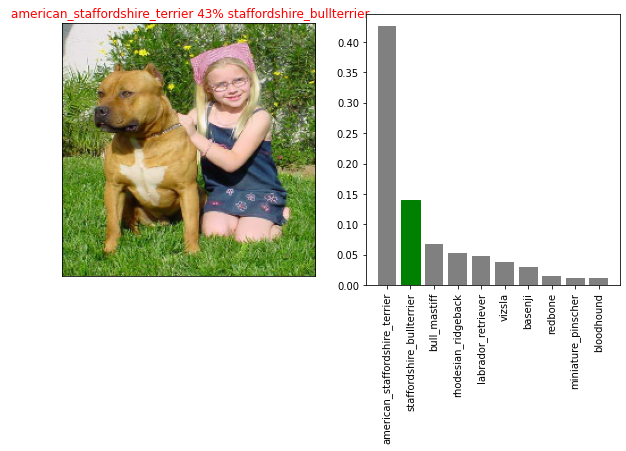

In [184]:
# Apelarea functiei de afisare complexa pentru imaginea cu indicele 99
compl_plot(i=99)

# 5. Training-ul modulului pe intregul set de date

In [185]:
# verificarea dimesiunilor setului X si y
len(X), len(y)

(10222, 10222)

In [186]:
# verificarea diemsiunii setului de training
len(X_train)

800

In [187]:
#Crearea bancurilor pentru intregul set de data
full_data=create_data_batches(X, y)

Se creaza bancul pentru datele de training


In [188]:
# vizualizarea integului set de date
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [189]:
#Crearea modulului pentru intregul set de date
full_model=create_model()

Constructia modelului cu: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [190]:
# crearea callcacks pentru modelul intregului set de date
full_model_tensorboard=create_tensorboard_callback()

In [191]:
# crearea early stopping pentru modelul intregului set de date
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                patience=3)

In [192]:
# traningul modelului pentru toate datele (va lua mult timp)
##full_model.fit(x=full_data,  # se comenteaza deoarece a fost salvat
##               epochs=NUM_EPOCHS,
##               callbacks=[full_model_tensorboard, full_model_early_stopping])

In [193]:
 # se salveaza modelul
 ##save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

In [194]:
# Se incarca modelul salvat
full_model=load_model('drive/MyDrive/Dog Vision/models/12121625141555-01072021-full-image-set-mobilenetv2-Adam.h5')

Se incarca modelul salvat pe drive/MyDrive/Dog Vision/models/12121625141555-01072021-full-image-set-mobilenetv2-Adam.h5


# 6. Predictia asupra propriilor date

Imaginiile proprii se incarca pe google drive pe calea `Dog Vision/my-dog-photos/`

---



In [195]:
#Incarcarea denumirilor fisierelor imaginilor proprii
import os
custom_path='drive/MyDrive/Dog Vision/my-dog-photos/'
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/Greta.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/Martinel.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/Bucurel.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/shih-tzu.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/tibetan_terrier.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/lakeland-terrier-2.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/YellowLabradorLooking.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/Kuvasz-07-610x443.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/labrador-962177576.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/Kuvasz.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/kerry_blue_terrier.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/collie.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/husky-siberian_1.jpg']

In [196]:
# Crearea bancuri pentru imagiile proprii
custom_data=create_data_batches(custom_image_paths,test_data=True)

Se creaza bancul pentru datele de test


In [197]:
# se vizualizeaza tensorii de intrare
custom_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [198]:
# Se realizeaza predictia asupra datelor proprii (va lua timp)
custom_preds=full_model.predict(custom_data)

In [199]:
# se vizualizeaza forma datelor prezise
custom_preds.shape

(13, 120)

In [200]:
# Extragerea numelui cainelui din denumirile imaginilor
custom_numes=[os.path.splitext(path)[0] for path in os.listdir(custom_path)]
custom_numes

['Greta',
 'Martinel',
 'Bucurel',
 'shih-tzu',
 'tibetan_terrier',
 'lakeland-terrier-2',
 'YellowLabradorLooking',
 'Kuvasz-07-610x443',
 'labrador-962177576',
 'Kuvasz',
 'kerry_blue_terrier',
 'collie',
 'husky-siberian_1']

In [201]:
#Creare functiei de unbatch imaginile proprii
def unbatchify_custom_image(data):
  images=[]
  for image in custom_data.unbatch().as_numpy_iterator():
      images.append(image)
  return images

In [202]:
#Apelarea functie
custom_images = unbatchify_custom_image(custom_data)
custom_images[0]

array([[[0.19562702, 0.1838623 , 0.16425446],
        [0.35136557, 0.33960086, 0.31999302],
        [0.20337635, 0.19161165, 0.17133853],
        ...,
        [0.8063943 , 0.77502173, 0.7240413 ],
        [0.82721895, 0.80368954, 0.7487875 ],
        [0.77330256, 0.74977314, 0.68702805]],

       [[0.20076407, 0.18899937, 0.16939151],
        [0.43115875, 0.41939405, 0.3997862 ],
        [0.21852241, 0.20675771, 0.18714985],
        ...,
        [0.7157974 , 0.68834645, 0.62560135],
        [0.8101154 , 0.77874285, 0.73560554],
        [0.79173875, 0.7603662 , 0.7093858 ]],

       [[0.40262854, 0.39086384, 0.37125596],
        [0.4221289 , 0.41036418, 0.39075634],
        [0.25145435, 0.23968963, 0.22008179],
        ...,
        [0.67446107, 0.6470101 , 0.584265  ],
        [0.58427763, 0.5529051 , 0.50976783],
        [0.7037969 , 0.6724244 , 0.621444  ]],

       ...,

       [[0.9757471 , 0.9373377 , 0.8902789 ],
        [0.804771  , 0.7655553 , 0.71849644],
        [0.80973524, 0

In [203]:
# se creaza functia de vizualizarea a numelui, rasei prezise, procentajul si imaginea corespunzatoare
def plot_pred_test(prediction_probabilities, images, n=1):
  """
  Vizualizarea predictiei, valorii adevarate si a imafini pentru sample n
  """
  custom_nume, pred_prob, image = custom_numes[n], prediction_probabilities[n],  images[n]

  #Obtinerea valorii prezise
  pred_label=get_pred_label(pred_prob)
  
  #Plot imaginea si stergerea axelor
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Fixarea titlului ca sa cuprinda toate componentele 
  plt.title(f' Nume: {custom_nume}, rasa: {pred_label}, probabil. prezicerii: {np.max(pred_prob)*100:2.0f}%')

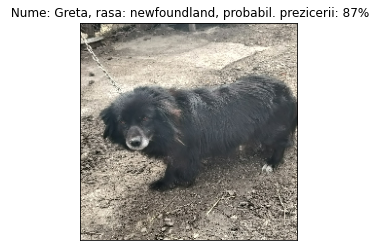

In [204]:
# Apelarea functiei de vizualizare pentru imaginea cu indicele 0
plot_pred_test(prediction_probabilities= custom_preds,
          images=custom_images, n=0)

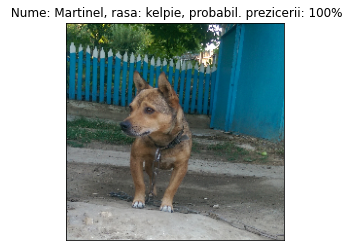

In [205]:
# Apelarea functiei de vizualizare pentru imaginea cu indicele 1
plot_pred_test(prediction_probabilities= custom_preds,
          images=custom_images, n=1)

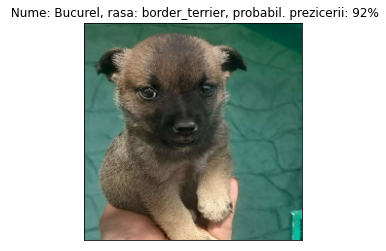

In [206]:
# Apelarea functiei de vizualizare pentru imaginea cu indicele 2
plot_pred_test(prediction_probabilities= custom_preds,
          images=custom_images, n=2)

In [207]:
# se creaza o functie de vizualizarea a top 10 rase prezise
def plot_pred_conf_custom(prediction_probabilities, n=1):
  """
  Vizualizarea predictiei, valorii adevarate si a imafini pentru sample n
  """
  pred_prob = prediction_probabilities[n]
  
  #Obtinerea valorii prezise
  pred_label=get_pred_label(pred_prob)

  # Determinarea indicilor primelor 10 predictii
  top_10_pred_indexes=pred_prob.argsort()[::-1][:10]

  # Determinarea celor 10 probabilitati cu valori cele mai mari
  top_10_pred_values=pred_prob[top_10_pred_indexes]

  # Determinarea prezicirelor care au 10 cele mai mari probabilitati
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  #Setarea graficului
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="blue")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  plt.title("Ponderea rasei prezise")

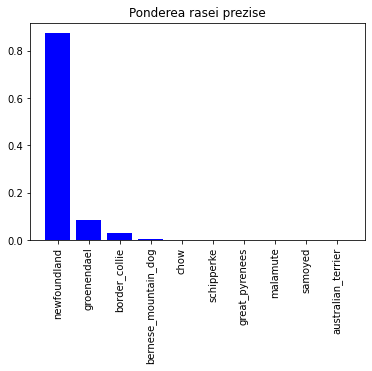

In [208]:
# Apelarea functiei de vizualizarea a top 10 rase pentru imaginea cu indicele 0
plot_pred_conf_custom(prediction_probabilities=custom_preds, n=0)

In [209]:
# Crearea functiei de afisare complexa ( si imagine si top 10 rase) dupa indice imaginilor
def compl_plot_custom(i=0):
  plt.figure(figsize=(16, 8))
  plt.subplot(1, 2, 1)
  plot_pred_test(prediction_probabilities= custom_preds,
          images=custom_images, n=i)
  plt.subplot(1, 2, 2)
  plot_pred_conf_custom(prediction_probabilities=custom_preds, n=i)
  plt.tight_layout(w_pad=1.0)
  plt.show()

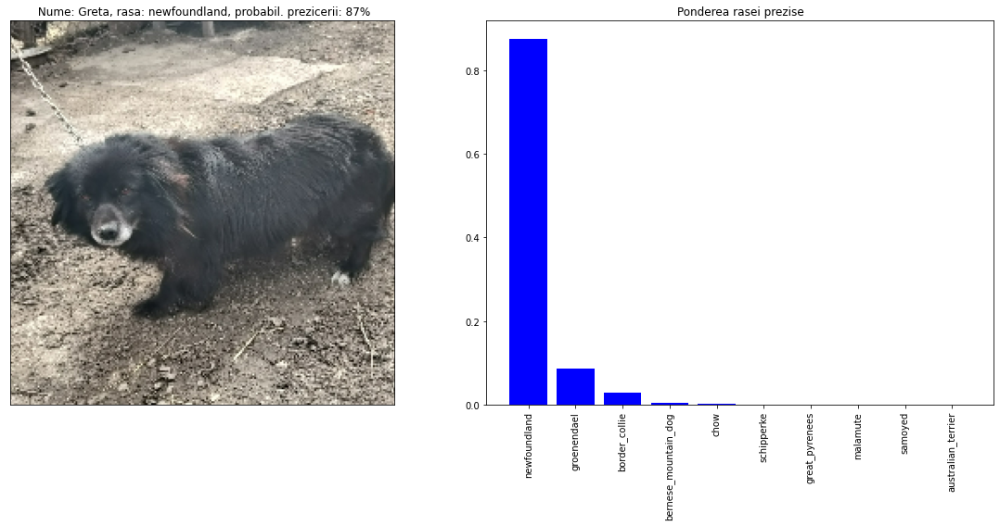

In [210]:
# Apelarea functiei de vizualizarea compleza pentru imaginea cu indicele 0
compl_plot_custom(i=0)

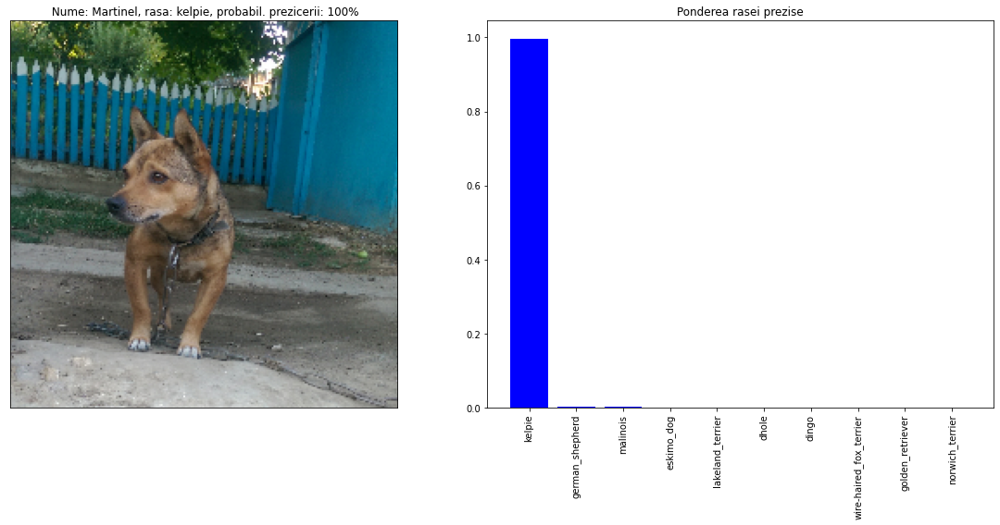

In [211]:
# Apelarea functiei de vizualizarea compleza pentru imaginea cu indicele 1
compl_plot_custom(i=1)

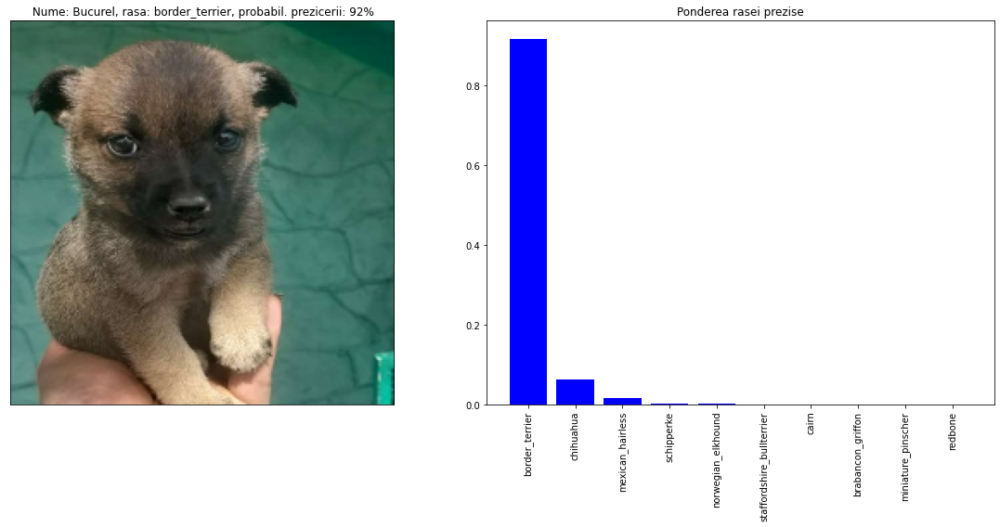

In [212]:
# Apelarea functiei de vizualizarea compleza pentru imaginea cu indicele 2
compl_plot_custom(i=2)

In [213]:
# Listarea raselor obtinute
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['newfoundland',
 'kelpie',
 'border_terrier',
 'lhasa',
 'tibetan_terrier',
 'lakeland_terrier',
 'labrador_retriever',
 'kuvasz',
 'flat-coated_retriever',
 'kuvasz',
 'kerry_blue_terrier',
 'collie',
 'siberian_husky']

In [214]:
# Apelarea functiei de vizualizarea compleza pentru toate imaginile
for a in range(len(custom_image_paths)):
  compl_plot_custom(i=a)


Output hidden; open in https://colab.research.google.com to view.